In [1]:
# Improve by ChatGPT & GitHub Copilot

# Running the requierements.ipynb
%run requierements.ipynb

# Loading the data 
%run data_loading.ipynb 

<xarray.DataArray 'nav_lat' (y: 20, x: 788)>
dask.array<getitem, shape=(20, 788), dtype=float32, chunksize=(20, 788), chunktype=numpy.ndarray>
Coordinates:
    nav_lat  (y, x) float32 dask.array<chunksize=(20, 788), meta=np.ndarray>
    nav_lon  (y, x) float32 dask.array<chunksize=(20, 788), meta=np.ndarray>
Dimensions without coordinates: y, x
Attributes:
    standard_name:  latitude
    long_name:      Latitude
    units:          degrees_north
<xarray.DataArray 'nav_lon' (y: 853, x: 20)>
dask.array<getitem, shape=(853, 20), dtype=float32, chunksize=(853, 20), chunktype=numpy.ndarray>
Coordinates:
    nav_lat  (y, x) float32 dask.array<chunksize=(853, 20), meta=np.ndarray>
    nav_lon  (y, x) float32 dask.array<chunksize=(853, 20), meta=np.ndarray>
Dimensions without coordinates: y, x
Attributes:
    standard_name:  longitude
    long_name:      Longitude
    units:          degrees_east


# Exercises on CALEDO

## Analysis

### 2D Map

Compute the 2D map of the mean SSH (MSS) over a month.

In [3]:
############################################################################
######################### Computing the monthly MSS ########################
############################################################################

# Define the geographic domain
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Extract latitude and longitude coordinates
lat = SSH_01['nav_lat']
lon = SSH_01['nav_lon']

# Compute the mean Sea Surface Height (SSH) over the time_counter dimension
mean_ssh_01 = SSH_01['zos'].mean(dim='time_counter')



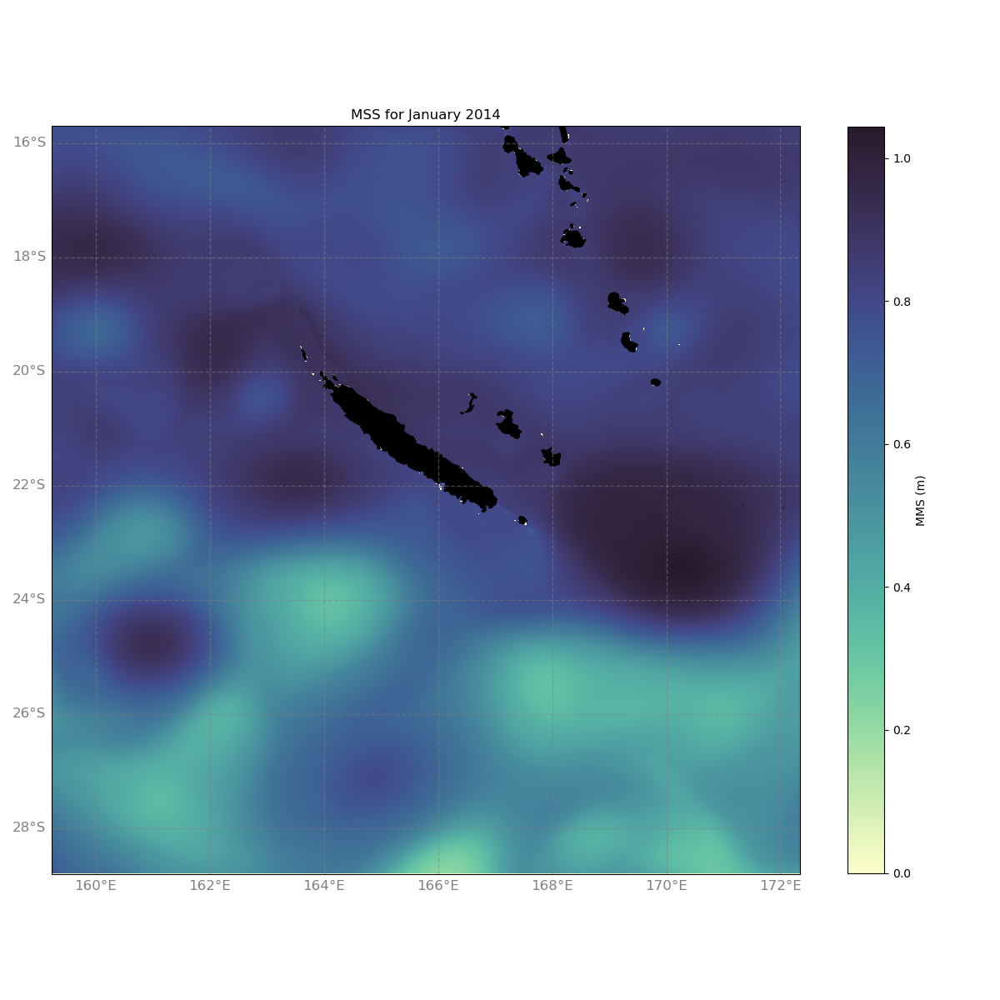

In [12]:
############################################################################
######################### Plotting MSS for January #########################
############################################################################

# Define the projection
projection = ccrs.PlateCarree()

# Create a plot with the specified projection
fig, ax = plt.subplots(figsize=(12, 12), 
                       subplot_kw={'projection': projection})

# Set the extent of the plot to match the specified domain
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add geographical features with explicit zorder for layering
ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='black', facecolor='black', zorder=1)

# For IPCC color palette 
# Read the RGB data from the text file and normalize it to the 0-1 range
# rgb_data = np.loadtxt('slev.txt' ) / 255.0 #255 is the maximum value of the color
# Create the custom colormap
# custom_colormap = mcolors.LinearSegmentedColormap.from_list('custom_colormap', rgb_data)

# Plot SSH as the background with adjusted zorder
ssh_plot = ax.pcolormesh(lon, lat, mean_ssh_01, shading='auto', cmap=cmocean.cm.deep, zorder=0, transform=ccrs.PlateCarree()) 
fig.colorbar(ssh_plot, ax=ax, label='MMS (m)', shrink = 0.765)

# Plot SSH using filled contours
#min_ssh_01, max_ssh_01, num_levels_01 = mean_ssh_01.min(), mean_ssh_01.max(), 30 
#ssh_contourf_01 = ax.contourf(lon, lat, mean_ssh_01, levels=np.linspace(min_ssh_01, max_ssh_01, num_levels_01), cmap=cmocean.cm.deep, zorder=0, transform=ccrs.PlateCarree())
#fig.colorbar(ssh_contourf_01, ax=ax, label='MSS (m)', shrink=0.765)

# Set labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('MSS for January 2014')
ax.set_aspect('equal', adjustable='box')

# Add gridlines with labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  # Disable labels at the top
gl.right_labels = False  # Disable labels on the right
gl.xlabel_style = {'size': 12, 'color': 'gray'}  # Customize the style of the longitude labels
gl.ylabel_style = {'size': 12, 'color': 'gray'}  # Customize the style of the latitude labels

plt.tight_layout()  # Adjust the layout to prevent overlap of labels

plt.show()

**MSS by year (2014)**

In [4]:
############################################################################
######################### Computing the yearly MSS #########################
############################################################################

# Define the geographic domain
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Extract latitude and longitude coordinates
lat = SSH['nav_lat']
lon = SSH['nav_lon']

# Assuming SSH_01 is the loaded dataset
# Compute the mean Sea Surface Height (SSH) over the time_counter dimension
mean_ssh = SSH['zos'].mean(dim='time_counter')



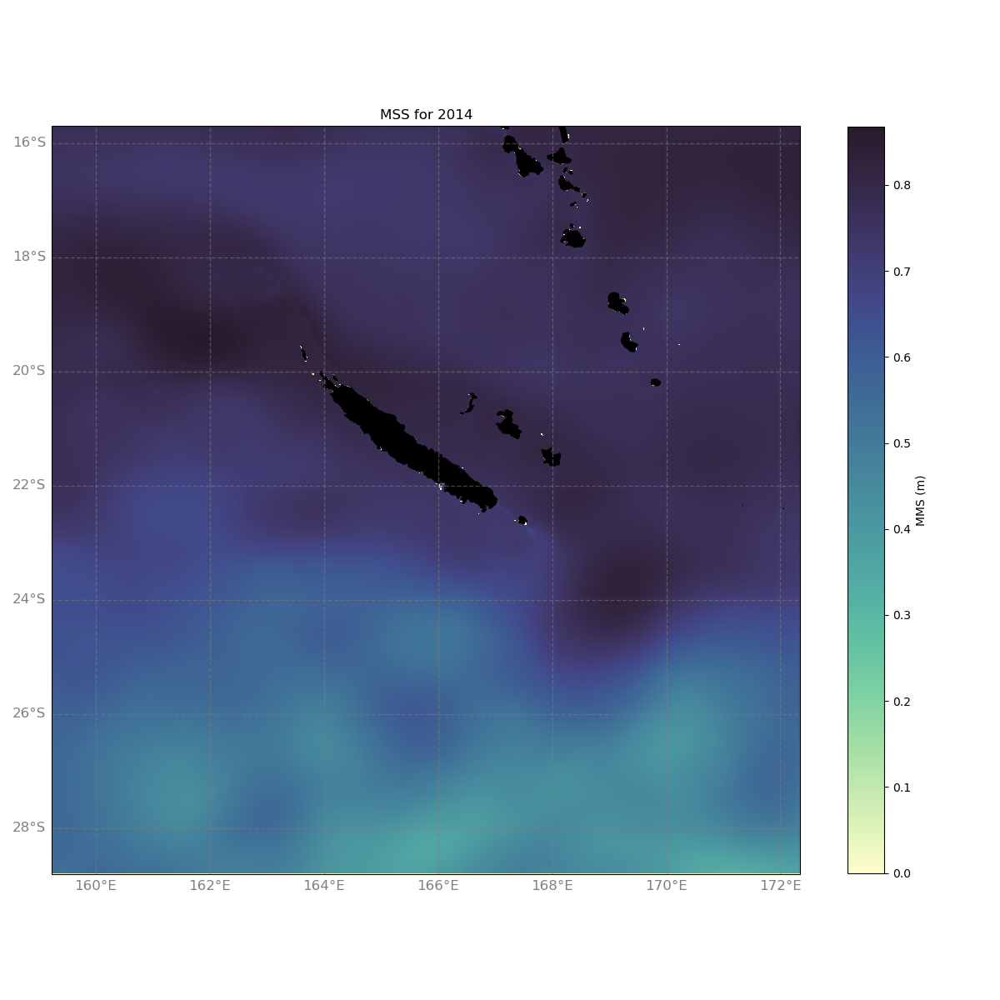

In [5]:
############################################################################
########################## Plotting MSS for 2014 ###########################
############################################################################

# Define the projection
projection = ccrs.PlateCarree()

# Create a plot with the specified projection
fig, ax = plt.subplots(figsize=(12, 12), 
                       subplot_kw={'projection': projection})

# Set the extent of the plot to match the specified domain
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add geographical features with explicit zorder for layering
ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='black', facecolor='black', zorder=1)

# For IPCC color palette 
# Read the RGB data from the text file and normalize it to the 0-1 range
#rgb_data = np.loadtxt('slev.txt' ) / 255.0 #255 is the maximum value of the color
# Create the custom colormap
#custom_colormap = mcolors.LinearSegmentedColormap.from_list('custom_colormap', rgb_data)

# Plot SSH as the background with adjusted zorder
ssh_plot = ax.pcolormesh(lon, lat, mean_ssh, shading='auto', cmap=cmocean.cm.deep, zorder=0, transform=ccrs.PlateCarree()) 
fig.colorbar(ssh_plot, ax=ax, label='MMS (m)', shrink = 0.765)

# Plot SSH using filled contours
# min_ssh, max_ssh, num_levels = mean_ssh.min(), mean_ssh.max(), 30 
# ssh_contourf = ax.contourf(lon, lat, mean_ssh, levels=np.linspace(min_ssh, max_ssh, num_levels), cmap=cmocean.cm.deep, zorder=0, transform=ccrs.PlateCarree())
# fig.colorbar(ssh_contourf, ax=ax, label='MSS (m)', shrink=0.765)

# Set labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('MSS for 2014')
ax.set_aspect('equal', adjustable='box')

# Add gridlines with labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  # Disable labels at the top
gl.right_labels = False  # Disable labels on the right
gl.xlabel_style = {'size': 12, 'color': 'gray'}  # Customize the style of the longitude labels
gl.ylabel_style = {'size': 12, 'color': 'gray'}  # Customize the style of the latitude labels

plt.tight_layout()  # Adjust the layout to prevent overlap of labels

plt.show()

#### Warnign: Takes like 9 minutes to run this cell ####

/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array

KeyboardInterrupt: 

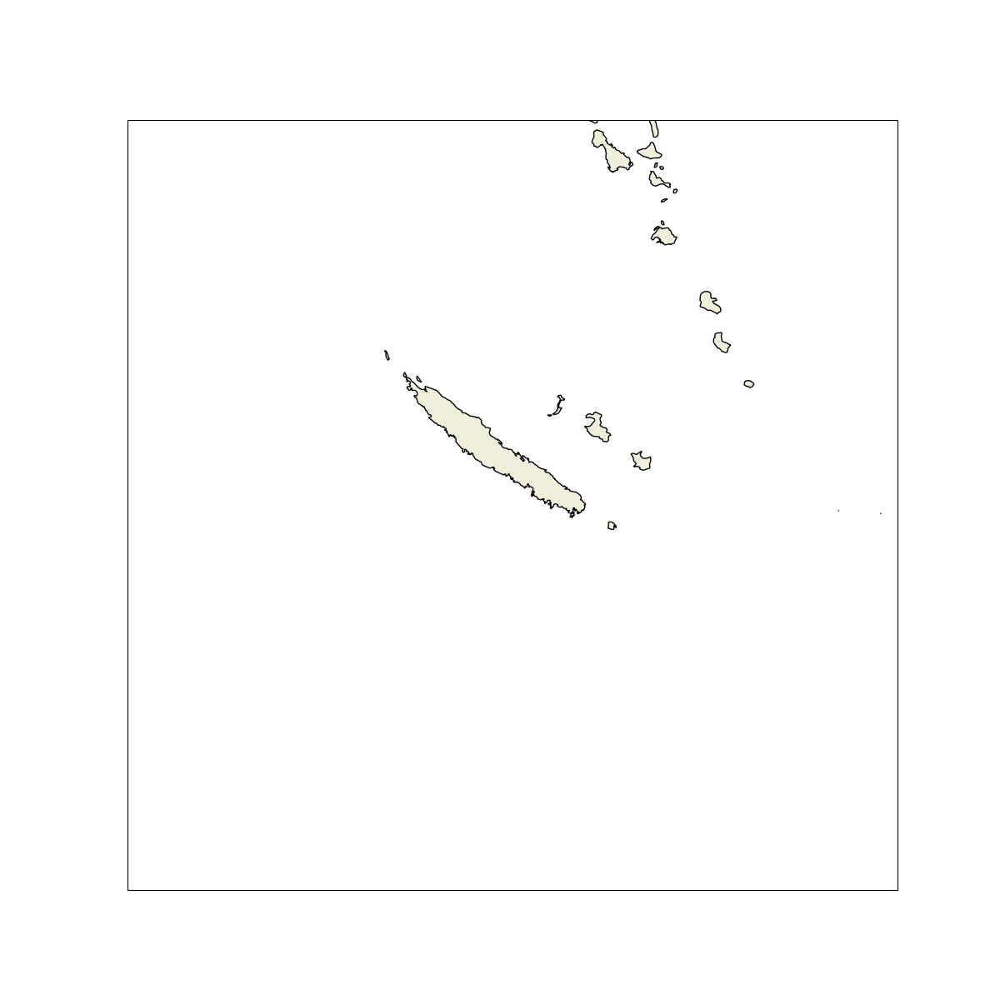

In [16]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import calendar

# Define plotting extents (adjust these to your specific region of interest)
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Define the projection
projection = ccrs.PlateCarree()

# Month names for titles
month_names = [calendar.month_name[i] for i in range(1, 13)]

# Iterate over each month
for month in range(1, 13):
    # Select data for the specific month and calculate the mean
    mean_ssh = SSH['zos'].sel(time_counter=SSH.time_counter.dt.month == month).mean(dim='time_counter')
    
    # Create a plot with the specified projection
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': projection})
    
    # Set the extent of the plot
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    
    # Add geographical features
    ax.add_feature(cfeature.LAND, edgecolor='black')
    
    # Plot SSH
    ssh_plot = ax.pcolormesh(SSH['nav_lon'], SSH['nav_lat'], mean_ssh, transform=ccrs.PlateCarree(), cmap=cmocean.cm.deep)
    plt.colorbar(ssh_plot, ax=ax, orientation='vertical', label='Sea Surface Height (m)')
    
    # Set title with the month name
    ax.set_title(f'Sea Surface Height for {month_names[month-1]}')
    
    plt.tight_layout()
    # Replace '/path/to/save/' with the actual directory where you want to save the images
    plt.savefig(f'/bettik/PROJECTS/pr-data-ocean/riverama/varios/MSS/MSS_for_{month_names[month-1]}.png')
    plt.close(fig)  # Close the figure to free memory


/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array

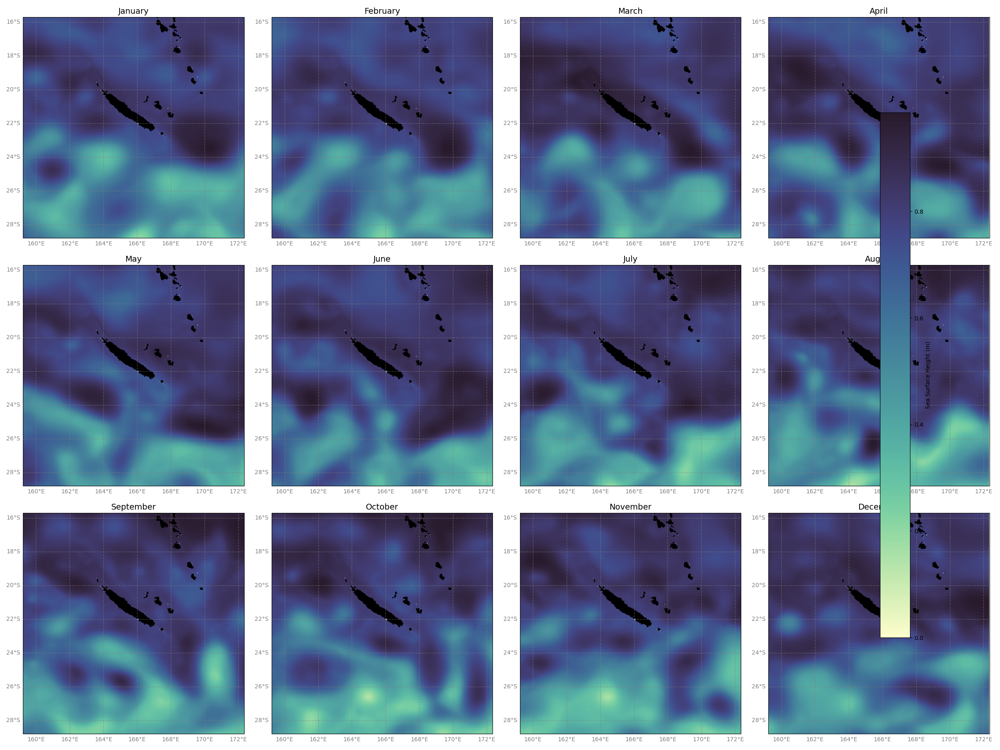

In [7]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import calendar
import numpy as np
import matplotlib.colors as mcolors

# Define plotting extents
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Define the projection
projection = ccrs.PlateCarree()

# Month names for titles
month_names = [calendar.month_name[i] for i in range(1, 13)]

# Create a figure with 3 rows and 4 columns of subplots, sharing axes
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(24, 18), subplot_kw={'projection': projection}, sharex=True, sharey=True)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for month, ax in zip(range(1, 13), axs):
    # Select data for the specific month and calculate the mean
    mean_ssh = SSH['zos'].sel(time_counter=SSH.time_counter.dt.month == month).mean(dim='time_counter')
    
    # Set the extent of the plot for this subplot
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    
    # Add geographical features to this subplot with explicit zorder for layering
    ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='black', facecolor='black', zorder=2)
    
    # Plot SSH for this subplot with adjusted zorder
    ssh_plot = ax.pcolormesh(SSH['nav_lon'], SSH['nav_lat'], mean_ssh, shading='auto', cmap=cmocean.cm.deep, zorder=1, transform=ccrs.PlateCarree())
    
    # Add gridlines with labels, customizing style and disabling unwanted labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder=3)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'color': 'gray'}
    gl.ylabel_style = {'size': 10, 'color': 'gray'}
    
    # Set title with the month name for this subplot
    ax.set_title(f'{month_names[month-1]}', size=14)

# Adjust layout to prevent overlap and ensure everything fits
plt.tight_layout()

# Add a single colorbar for all subplots
cbar_ax = fig.add_axes([0.88, 0.15, 0.03, 0.7])  # Adjust these values as needed
fig.colorbar(ssh_plot, cax=cbar_ax, orientation='vertical', label='Sea Surface Height (m)')

# Show or save the figure
# plt.show()  # Uncomment to display the figure
#plt.savefig('/path/to/save/SSH_matrix_plot.png')  # Replace with your path to save the figure
#plt.close(fig)  # Close the figure to free memory


/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xarray/core/indexing.py:1443: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array

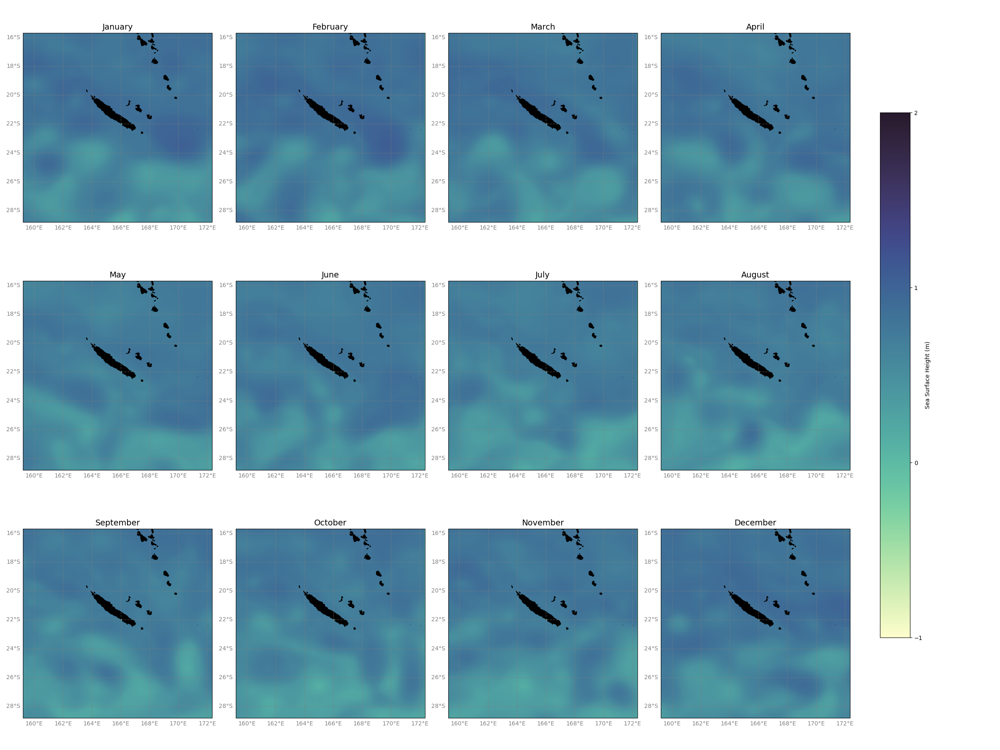

In [6]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import calendar
import numpy as np
import matplotlib.colors as mcolors

# Define plotting extents
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Define the projection
projection = ccrs.PlateCarree()

# Month names for titles
month_names = [calendar.month_name[i] for i in range(1, 13)]

# Create a figure with 3 rows and 4 columns of subplots, sharing axes
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(24, 18), subplot_kw={'projection': projection}, sharex=True, sharey=True)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for month, ax in zip(range(1, 13), axs):
    # Select data for the specific month and calculate the mean
    mean_ssh = SSH['zos'].sel(time_counter=SSH.time_counter.dt.month == month).mean(dim='time_counter')
    
    # Set the extent of the plot for this subplot
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    
    # Add geographical features to this subplot with explicit zorder for layering
    ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='black', facecolor='black', zorder=2)
    
    # Plot SSH for this subplot with adjusted zorder and specify vmin and vmax for color scale
    ssh_plot = ax.pcolormesh(SSH['nav_lon'], SSH['nav_lat'], mean_ssh, shading='auto', cmap=cmocean.cm.deep, zorder=1, vmin=-1, vmax=2, transform=ccrs.PlateCarree())
    
    # Add gridlines with labels, customizing style and disabling unwanted labels
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder=3)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10, 'color': 'gray'}
    gl.ylabel_style = {'size': 10, 'color': 'gray'}
    
    # Set title with the month name for this subplot
    ax.set_title(f'{month_names[month-1]}', size=14)

# Adjust layout to prevent overlap, ensure everything fits, and leave space for the color bar
plt.tight_layout()
fig.subplots_adjust(right=0.85)

# Add a single colorbar for all subplots, adjusted to fit into the space created
cbar_ax = fig.add_axes([0.88, 0.15, 0.03, 0.7])  # Adjust these values as needed
cbar = fig.colorbar(ssh_plot, cax=cbar_ax, orientation='vertical', label='Sea Surface Height (m)')
cbar.set_ticks(np.arange(-1, 2.1, 1))  # Set custom ticks if needed

# Show or save the figure
# plt.show()  # Uncomment to display the figure
# plt.savefig('/path/to/save/SSH_matrix_plot.png')  # Replace with your path to save the figure
# plt.close(fig)  # Close the figure to free memory


In [5]:
# Assuming the rest of your code remains the same

# Adjust layout to prevent overlap and ensure everything fits
plt.tight_layout()

# Add a single colorbar for all subplots, but place it on the left side
# Modify the add_axes values: left position, bottom position, width, and height
cbar_ax = fig.add_axes([0.05, 0.15, 0.02, 0.7])  # Moved to the left by adjusting the first parameter
fig.colorbar(ssh_plot, cax=cbar_ax, orientation='vertical', label='Sea Surface Height (m)')

# Show or save the figure
# plt.show()  # Uncomment to display the figure
#plt.savefig('/path/to/save/SSH_matrix_plot.png')  # Replace with your path to save the figure
#plt.close(fig)  # Close the figure to free memory


/tmp/ipykernel_2605748/4048994422.py:4: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [7]:
ds = SSH
# Use the 'y' and 'x' dimensions directly for the 'zos' variable
y_size = ds['zos'].sizes['y']
x_size = ds['zos'].sizes['x']

# Calculate the number of pixels
num_pixels = y_size * x_size

print(f"Number of pixels in 'zos': {num_pixels}")

Number of pixels in 'zos': 672164


## 2D Map SLA

Compute the 2D map of Sea Level Anomaly at a given date (e.g. 15th May)

$$
\operatorname{SLA}(x, y, t)=\operatorname{SSH}(x, y, t)-\operatorname{MSS}(x, y)
$$

In [6]:
# Step 1: Select the SSH data for 15th May 2014
ssh_may15 = SSH.sel(time_counter='2014-05-15')

# Step 2: Calculate the Mean Sea Surface (MSS)
# This might take time depending on the size of your dataset and computing resources
mss = SSH.zos.mean(dim='time_counter')

# Step 3: Compute the Sea Level Anomaly (SLA) for 15th May
sla_may15 = ssh_may15.zos - mss

In [7]:
sla_may15

<xarray.DataArray 'zos' (time_counter: 24, y: 853, x: 788)>
dask.array<sub, shape=(24, 853, 788), dtype=float32, chunksize=(24, 853, 788), chunktype=numpy.ndarray>
Coordinates:
    nav_lat       (y, x) float32 dask.array<chunksize=(853, 788), meta=np.ndarray>
    nav_lon       (y, x) float32 dask.array<chunksize=(853, 788), meta=np.ndarray>
  * time_counter  (time_counter) datetime64[ns] 2014-05-15T00:30:00 ... 2014-...
    time_instant  (time_counter) datetime64[ns] dask.array<chunksize=(24,), meta=np.ndarray>
Dimensions without coordinates: y, x

In [8]:
print(f"Maximum value: {sla_may15.max().values}")
print(f"Minimum value: {sla_may15.min().values}")

Maximum value: 0.9835281372070312
Minimum value: -1.0510568618774414


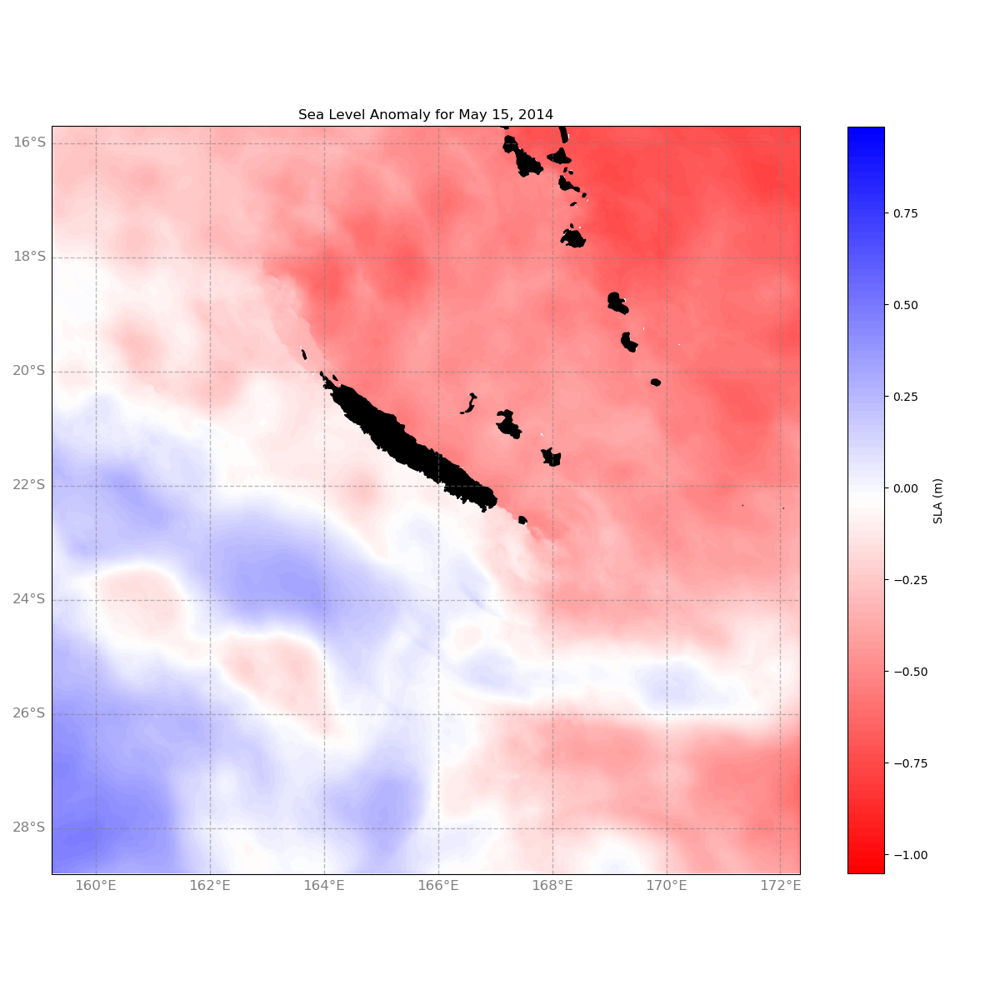

In [9]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

# Define the geographic domain
lon_min, lon_max = 159.23333740234375, 172.34999084472656
lat_min, lat_max = -28.803945541381836, -15.699763298034668

# Extract latitude and longitude coordinates
# Assuming SSH['nav_lat'] and SSH['nav_lon'] are given and correctly formatted
lat = SSH['nav_lat']
lon = SSH['nav_lon']

# Step 1: Select the SSH data for 15th May 2014
ssh_may15 = SSH.sel(time_counter='2014-05-15')

# Step 2: Calculate the Mean Sea Surface (MSS)
mss = SSH.zos.mean(dim='time_counter')

# Step 3: Compute the Sea Level Anomaly (SLA) for 15th May
sla_may15 = ssh_may15.zos - mss

# Calculate the minimum and maximum values of sla_may15
min_sla, max_sla = sla_may15.min().values, sla_may15.max().values

# Define the colors for the colormap
colors = [(1, 0, 0), (1, 1, 1), (0, 0, 1)]  # Red, White, Blue for min, 0, max respectively
n_bins = 100  # Number of color bins

# Create the custom colormap
cmap_name = 'custom_red_white_blue'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Assuming sla_may15 is your DataArray for the entire day of May 15, 2014
# Select the first time step (e.g., 00:30 on May 15, 2014)
sla_may15_single_time = sla_may15.isel(time_counter=0)

# Extract latitude and longitude coordinates for the plot
lat = sla_may15_single_time['nav_lat']
lon = sla_may15_single_time['nav_lon']
sla_data = sla_may15_single_time.data  # Accessing the 2D data array for the selected time step

# Define the geographic domain and projection
projection = ccrs.PlateCarree()

# Create a plot with the specified projection
fig, ax = plt.subplots(figsize=(12, 12), 
                       subplot_kw={'projection': projection})
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add geographical features
ax.add_feature(cfeature.LAND.with_scale('10m'), edgecolor='black', facecolor='black', zorder=1)

# Plot SLA using pcolormesh with the custom colormap
sla_pcolormesh = ax.pcolormesh(lon, lat, sla_data, cmap=custom_cmap, 
                               vmin=min_sla, vmax=max_sla, zorder=0, 
                               transform=ccrs.PlateCarree())

# Add a color bar
fig.colorbar(sla_pcolormesh, ax=ax, label='SLA (m)', shrink=0.765)

# Set labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Sea Level Anomaly for May 15, 2014')

# Add gridlines with labels
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12, 'color': 'gray'}
gl.ylabel_style = {'size': 12, 'color': 'gray'}

plt.tight_layout()
plt.show()


## Temporal Spectrum

Plot the spatially averaged temporal spectrum of the SSH - use xrft.

```python
spectrum = xrft.power_spectrum(ds, dim=['time'], detrend='constant', window=True).compute()
mean_spectrum = spectrum.mean(dim=['x','y']).where(spectrum.freq_time > 0., drop=True)
```

In [2]:
# 1. Data Selection
date_range = SSH.sel(time_counter=slice('2014-01-01 00:30', '2014-12-31 23:30'))

# 2. Drop coordinates that depend on 'time_counter'
zos = date_range['zos'].drop(['time_instant'])

# 3. Intelligent Rechunking (Consider experimenting with these values)
# Aim for chunk sizes that balance between computation efficiency and memory usage
# Explicitly rechunk the data so that 'time_counter' has a uniform size
# You might need to adjust the chunk size based on your dataset and availait_modesvble memory
# This step aims to create uniform chunk sizes for 'time_counter' while keeping spatial dimensions intact
zos_rechunked = zos.chunk({'time_counter': len(zos.time_counter), 'x': 'auto', 'y': 'auto'})

# 4. Compute the power spectrum
# This step remains resource-intensive and might benefit from Dask optimization settings
spectrum = xrft.power_spectrum(zos_rechunked, dim=['time_counter'], detrend='constant', window=True, chunks_to_segments=True).compute()

# 5. Spatially average the spectrum and filter frequencies
mean_spectrum = spectrum.mean(dim=['x', 'y']).where(spectrum.freq_time_counter > 0, drop=True)

# 6. Convert frequencies to periods (days)
periods = 1 / (mean_spectrum.freq_time_counter * 86400)

# Almost 5 min of running time

/home/riverama/.conda/envs/env-stage/lib/python3.11/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


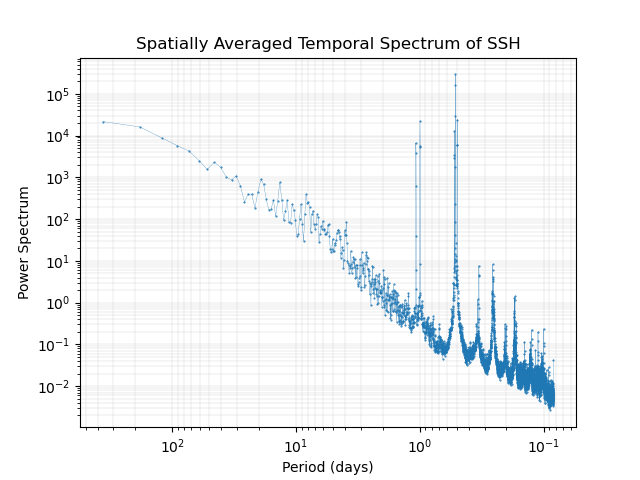

In [6]:
# Plotting
# Squeeze any singleton dimensions from 'mean_spectrum'
mean_spectrum_squeezed = mean_spectrum.squeeze()

plt.figure()
#plt.loglog(periods.freq_time_counter, mean_spectrum)
#plt.semilogy(periods, mean_spectrum, marker='.', markersize=3, linestyle='-', linewidth=0.1)
plt.loglog(periods, mean_spectrum_squeezed, marker='.', markersize=1, linestyle='-', linewidth=0.2)
plt.xlabel('Period (days)')
plt.ylabel('Power Spectrum')
plt.title('Spatially Averaged Temporal Spectrum of SSH')

# Invert the x-axis by setting the xlim with reversed limits
plt.xlim(plt.xlim()[::-1])

plt.grid(True, which="both", ls="-", linewidth="0.3", color="lightgrey")
plt.show()